# SEIE Survey Data Analysis 

## Table of Contents<a id="1.1_Table_of_Contents"></a>
* [1 SEIE Survey Data Analysis](#1_SEIE_Survey_Data_Analysis)
    * [1.2 Load Data](#1.2_Load_Data)
    * [1.3 Explore Data](#1.3_Explore_Data)
    * [1.4 Basic Plots](#1.4_Basic_Plots)
    * [1.5 Word Cloud](#1.5_Word_Cloud)
    * [1.6 Count Vectorizer](#1.6_Count_Vectorizer)
    * [1.7 TF-IDF Vectorizer](#1.7_TF_-_IDF_Vectorizer)

might be redudant but list of main ideas:  
1.) What ethnic group do you identify with?   
2.) How do you gender identify?   
3.) What Neighborhood Council are you from?     
4.) For how many years have you been a member of your NC Board?   
5.) Viewpoint  
    a.) Housing   
    b.) Jobs/Business/Economic Development  
	c.) Schools, Education, & Arts/Culture  
	d.) Quality of Life  
	e.) Social & Supportive Services/ Mental Health   
	f.) Public Safety & Emergency Preparedness   
	g.) Infrastructure & Sustainability  
6.) Which are your top 3 of the possible categories?   
7.) Why did you select those as your top3? Anything to address regarding racial economic or social inequalities?   
8.) What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action?  
9.) How can the city best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity , and inclusion?  
	a.) how might community voices have input in discussions with city departments and decision makers about inclusion, equity, and social justice?   
10.) How might civic engagement be built into the development of City programs?  
11.) Comments  

In [1]:
#importing necessary modules
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline

from wordcloud import WordCloud

## Load Data<a id='1.2_Load_Data'></a>

In [2]:
data = pd.read_csv('./data/SEIEsurvey.csv')

In [3]:
data.head()

,Timestamp,What ethnic group do you identify with? (Your response is optional),"Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?","If you chose ""Prefer to self-describe"" to the previous question, please do so here.",What Neighborhood Council are you from?,For how many years have you been a member of your NC Board?,Please select the option that best represents your point of view.,HOUSING,JOBS / BUSINESS / ECONOMIC DEVELOPMENT,"SCHOOLS, EDUCATION & ARTS / CULTURE",QUALITY OF LIFE,SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH,PUBLIC SAFETY & EMERGENCY PREPAREDNESS,INFRASTRUCTURE & SUSTAINABILITY,"Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.","Please explain why the categories you chose above are your top 3 areas of concern. Please also feel free to use this space to talk about other priorities you have for addressing racial, economic, or social inequities in the City of Los Angeles which did not appear on the list above:","What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action?","How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice?",How might civic engagement be built into the development of City programs?,"Please share any other general comments, support or guidance that you might like to provide."
0,7/12/2020 0:54:17,Latino/Hispano,Male,NaN,Arleta,5-7 Years,Our communities have a high level of social an...,Cut taxes and regulations to create more jobs,"Promote business ownership, Support small busi...",Increase availability of educational/cultural ...,Recreation & wellness programs,Support non profit youth programs,Create more policing in communities,Infrastructure investment (such as street & si...,"Jobs / Business / Economic Development, School...",NaN,"Reduce taxes and regulations, school choice, m...",Ensure everyone is equal under the law,NaN,NaN
1,7/6/2020 19:56:49,Latino/Hispano,Female,NaN,Arroyo Seco,0-1 Year,Our communities have a high level of social an...,"Address rent control and evictions, Address th...","Create and promote living wage jobs, Help for ...","Youth recreation & development (youth centers,...","Address the ""digital divide"" (improve individu...",Increase access to mental health services & pr...,"Address over-policing in LA neighborhoods, Dev...",Infrastructure investment (such as street & si...,"Housing, Jobs / Business / Economic Developmen...",The housing situation in Los Angeles has racia...,Supported employment initiatives.\nScholarship...,Work with nonprofits leaders who have ties in ...,Ensuring that all programs go through communit...,NaN
2,7/7/2020 1:01:24,White/Caucasian,Male,NaN,Arroyo Seco,2-4 Years,Our communities have a moderate level economic...,"Address rent control and evictions, Address th...","Help for those seeking work, Support small bus...","Afterschool and/or child care programs, Increa...","Address the ""digital divide"" (improve individu...",Increase access to mental health services & pr...,Develop & support alternatives to armed crisis...,Infrastructure investment (such as street & si...,"Housing, Schools, Education & Arts / Culture, ...",A community is only as strong as its care and ...,"Funding for mental health services, schools an...",By establishing practices and procedures that ...,It must be part and parcel of any process that...,NaN
3,7/6/2020 21:19:29,Latino/Hispano,Male,NaN,Atwater Village,2-4 Years,Our communities have a high level of social an...,"Add

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 20 columns):
 #   Column                                                                                                                                                                                                                                                                                                       Non-Null Count  Dtype 
---  ------                                                                                                                                                                                                                                                                                                       --------------  ----- 
 0   Timestamp                                                                                                                                                                                                                               

## Explore Data<a id='1.3_Explore_Data'></a>

In [5]:
data.shape

(696, 20)

In [6]:
data.describe()

,Timestamp,What ethnic group do you identify with? (Your response is optional),"Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?","If you chose ""Prefer to self-describe"" to the previous question, please do so here.",What Neighborhood Council are you from?,For how many years have you been a member of your NC Board?,Please select the option that best represents your point of view.,HOUSING,JOBS / BUSINESS / ECONOMIC DEVELOPMENT,"SCHOOLS, EDUCATION & ARTS / CULTURE",QUALITY OF LIFE,SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH,PUBLIC SAFETY & EMERGENCY PREPAREDNESS,INFRASTRUCTURE & SUSTAINABILITY,"Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.","Please explain why the categories you chose above are your top 3 areas of concern. Please also feel free to use this space to talk about other priorities you have for addressing racial, economic, or social inequities in the City of Los Angeles which did not appear on the list above:","What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action?","How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice?",How might civic engagement be built into the development of City programs?,"Please share any other general comments, support or guidance that you might like to provide."
count,686,670,690,15,696,696,686,693,689,687,689,680,679,691,694,524,519,493,479,316
unique,683,37,7,15,98,7,7,167,199,153,272,110,169,110,126,497,493,466,449,297
top,7/10/2020 16:46:21,White/Caucasian,Male,"I have a problem with this, we are creating co...",West Hills,2-4 Years,Our communities have a high level of social an...,"Address rent control and evictions, Home owner...",Assistance with lending and financial institut...,"Address over-policing in schools, Youth recrea...","Address the ""digital divide"" (improve individu...",Increase access to mental health services & pr...,"Address over-policing in LA neighborhoods, Dev...",Infrastructure investment (such as street & si...,"Housing, Schools, Education & Arts / Culture, ...",Ultimately people's priority is safety and the...,"For schools, invest in providing equity and ac...",Language access and people who are good at com...,See above,The survey was a great start and hopefully the...
freq,2,343,337,1,20,248,299,156,100,164,103,195,155,214,62,4,4,4,5,4


In [7]:
data.columns

Index(['Timestamp',
       'What ethnic group do you identify with? (Your response is optional)',
       'Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?',
       'If you chose "Prefer to self-describe" to the previous question, please do so here.',
       'What Neighborhood Council are you from?',
       'For how many years have you been a member of your NC Board?',
       'Please select the option that best represents your point of view.',
       'HOUSING', 'JOBS / BUSINESS / ECONOMIC DEVELOPMENT',
       'SCHOOLS, EDUCATION & ARTS / CULTURE', 'QUALITY OF LIFE',
       'SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH',
       'PUBLIC SAFETY & EMERGENCY PREPAREDNESS',
       'INFRASTRUCTURE & SUSTAINABILITY',
       'Of the categories of possible City budget ini

In [8]:
data.isnull().sum() / data.shape[0]

Timestamp                                                                                                                                                                                                                                                                                                      0.014368
What ethnic group do you identify with? (Your response is optional)                                                                                                                                                                                                                                            0.037356
Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?                          0.008621
If you chose "Prefer to self-describe" to the previous question,

## Basic Plots<a id='1.4_Basic_Plots'></a>

In [9]:
data.iloc[:,1].value_counts()

White/Caucasian                                                                          343
Latino/Hispano                                                                           107
Black/African American                                                                    91
Asian/Pacific Islander                                                                    51
Multiethnic                                                                               36
Jewish                                                                                     3
Native American                                                                            3
Middle Eastern                                                                             3
Arab American                                                                              2
Irrelevant                                                                                 2
Persian                                                               

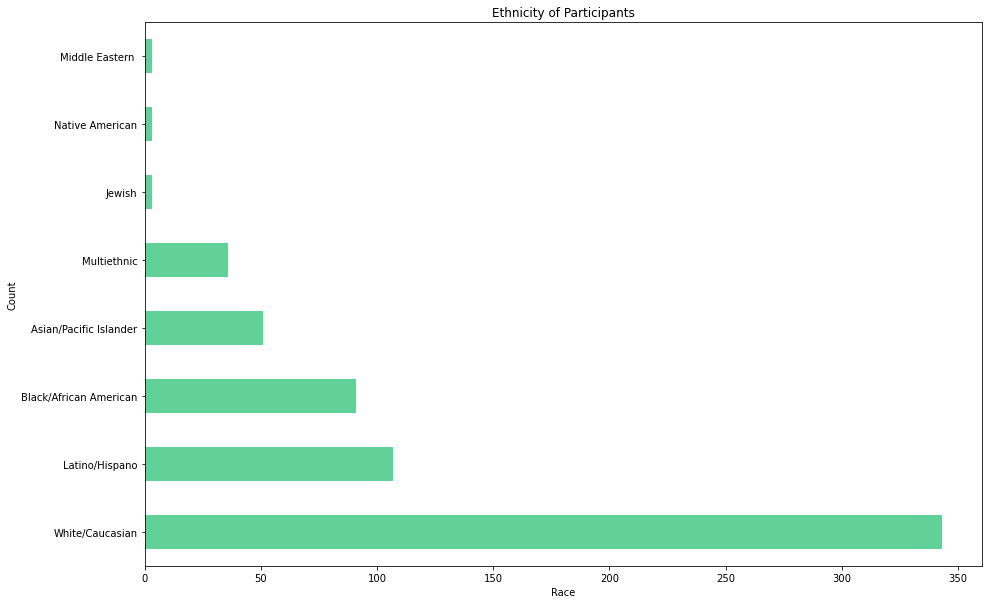

In [10]:
data.iloc[:,1].value_counts().head(8).plot(kind='barh', figsize=(15,10), color= '#61d199')
plt.title("Ethnicity of Participants")
plt.xlabel("Race")
plt.ylabel("Count")
plt.show()

In [11]:
data.iloc[:,2].value_counts()

Male                                                337
Female                                              317
Prefer not to say                                    21
Non-binary / Gender non-conforming / Genderfluid      6
Trans                                                 5
Prefer to self-describe (please use space below)      2
Mujer                                                 2
Name: Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?, dtype: int64

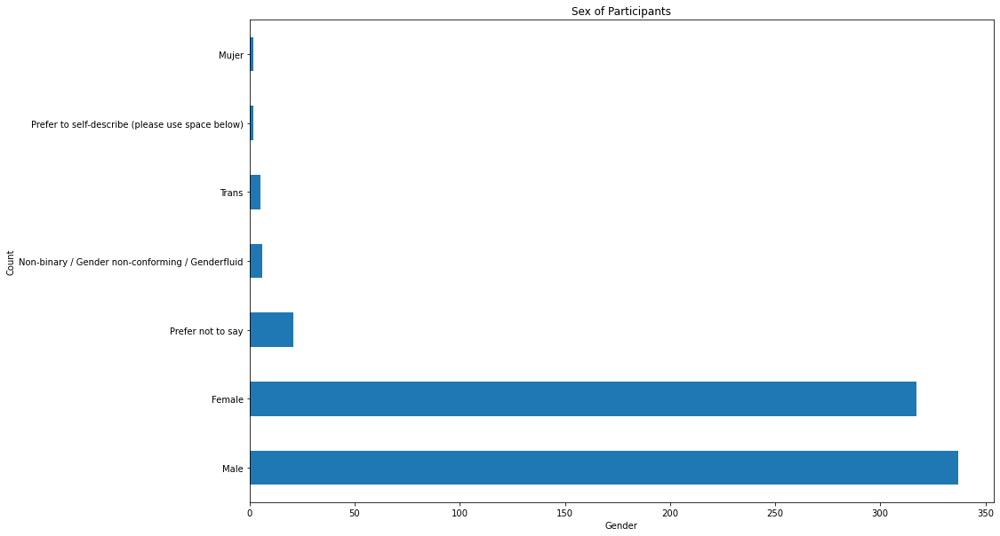

In [12]:
data.iloc[:,2].value_counts().plot(kind='barh', figsize=(15,10))
plt.title("Sex of Participants")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()

In [13]:
data.iloc[:,5].value_counts()

2-4 Years           248
0-1 Year            235
5-7 Years           102
10 years or more     67
8-10 Years           42
10 Años o más         1
2-4 Años              1
Name: For how many years have you been a member of your NC Board?, dtype: int64

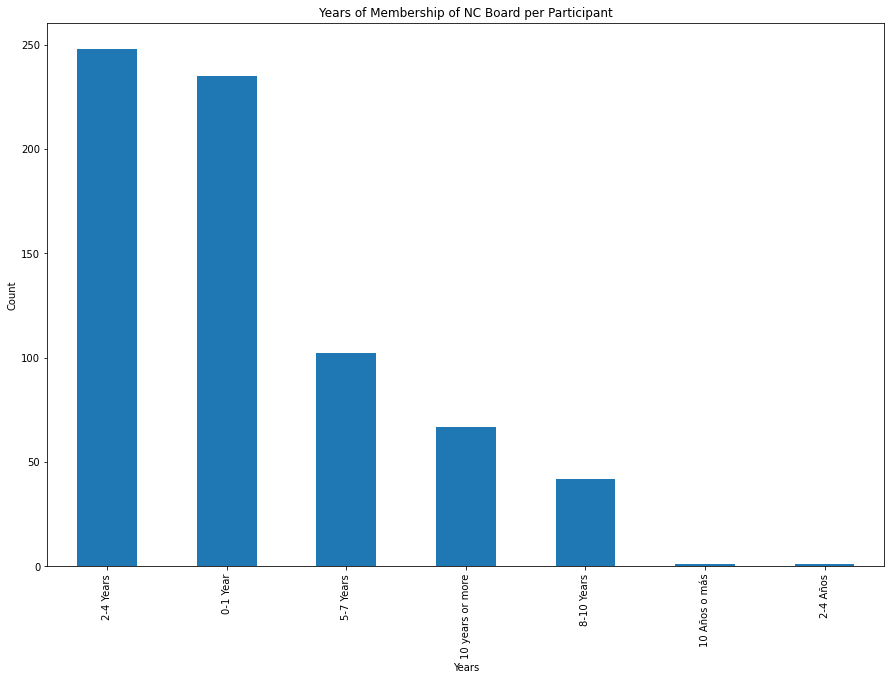

In [14]:
data.iloc[:,5].value_counts().plot(kind='bar', figsize=(15,10))
plt.title("Years of Membership of NC Board per Participant")
plt.xlabel("Years")
plt.ylabel("Count")
plt.show()

In [15]:
data.iloc[:,6].value_counts()

Our communities have a high level of social and economic disparity issues.                299
Our communitites have experienced an increase in social and economic disparity issues.    160
Our communities have a moderate level economic social or economic disparity issues.       144
Our communities have a small level of social or economic disparity issues.                 56
Our communities have no social or economic disparity issues.                               24
5                                                                                           2
3                                                                                           1
Name: Please select the option that best represents your point of view., dtype: int64

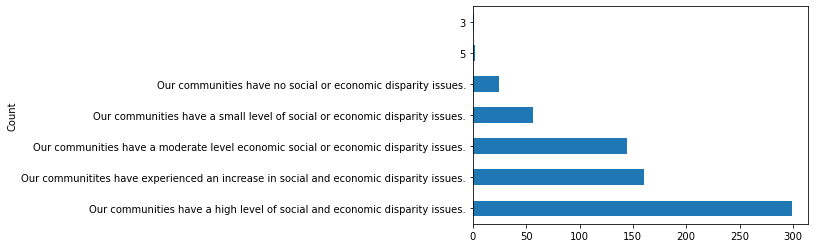

In [16]:
data.iloc[:,6].value_counts().plot(kind='barh')
plt.ylabel("Count")
plt.show()

In [17]:
df= data.fillna("")

## Word Cloud <a id="1.5_Word_Cloud"></a>

In [18]:
def get_word_cloud(text):
    wordcloud = WordCloud(
        width=1000,
        height=500,
        background_color="white").generate(str(text))
    fig = plt.figure(
        figsize= (40,30), 
        facecolor = 'k', 
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()
        

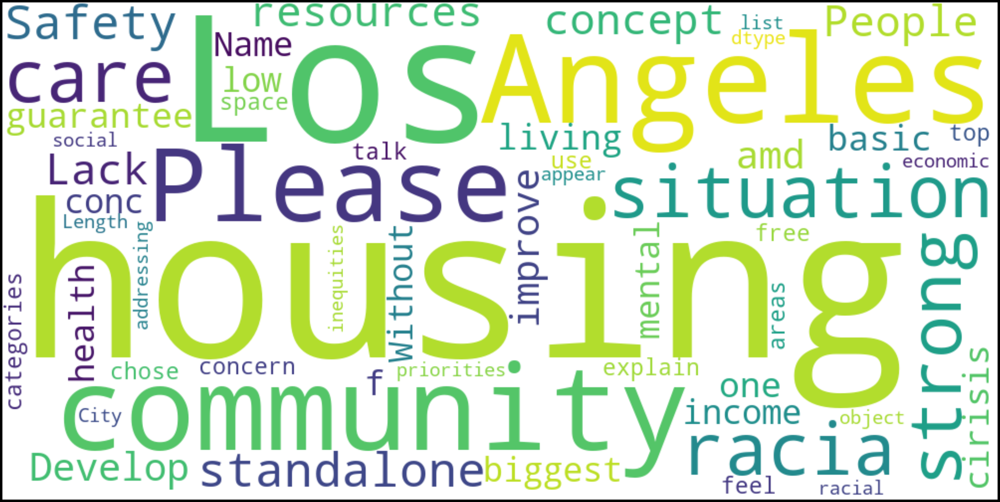

In [19]:
get_word_cloud(df.iloc[:,15])

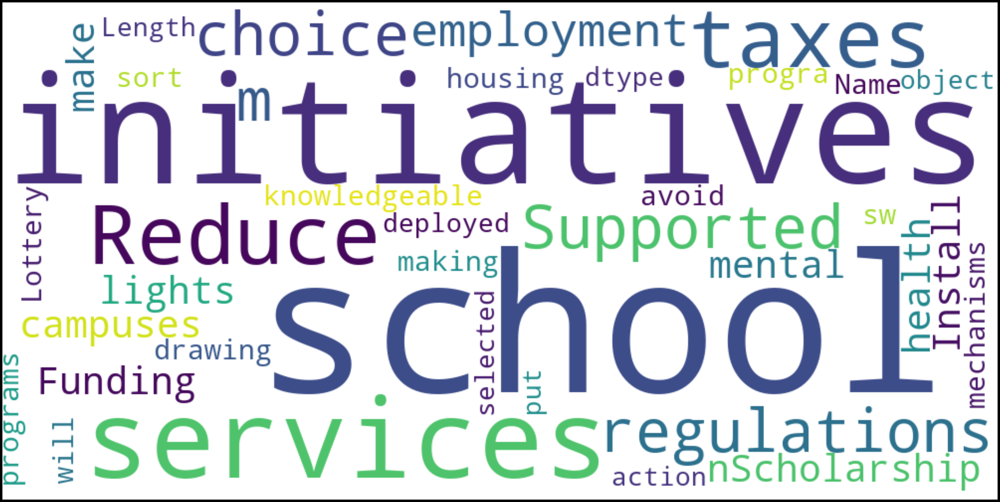

In [20]:
get_word_cloud(df.iloc[:,16])

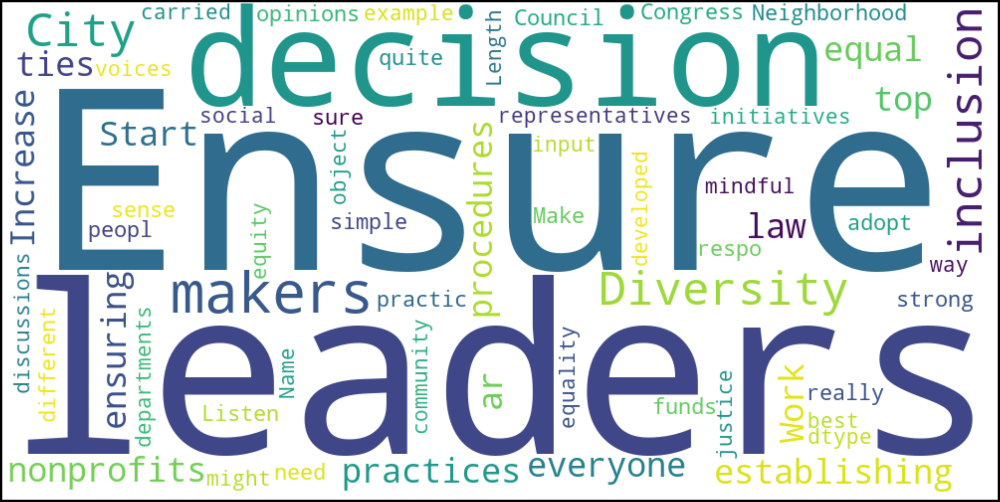

In [21]:
get_word_cloud(df.iloc[:,17])

## Count Vectorizer <a id="1.6_Count_Vectorizer"></a>

## unigrams from vectorized data

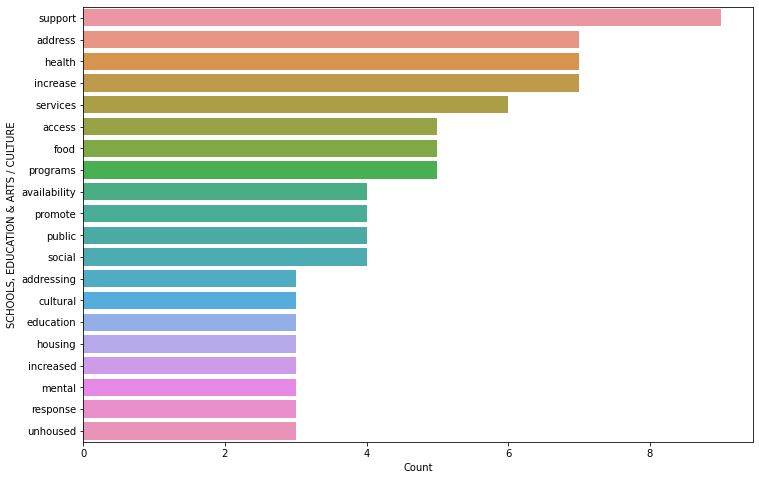

In [22]:
from sklearn.feature_extraction.text import CountVectorizer

word_vectorizer = CountVectorizer(ngram_range=(1,1), analyzer= "word", stop_words='english')
sparse_matrix= word_vectorizer.fit_transform(df.iloc[9])
freq = sum(sparse_matrix).toarray()[0]
word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names(), columns= ['frequency'])
word = word.nlargest(columns = "frequency", n=20)
plt.figure(figsize=(12,8))
ax = sns.barplot(data = word, y=word.index, x='frequency')
sns.set_context("poster")
ax.set(xlabel="Count", ylabel=df.columns[9])
plt.show()

## Bigrams from vectorized data

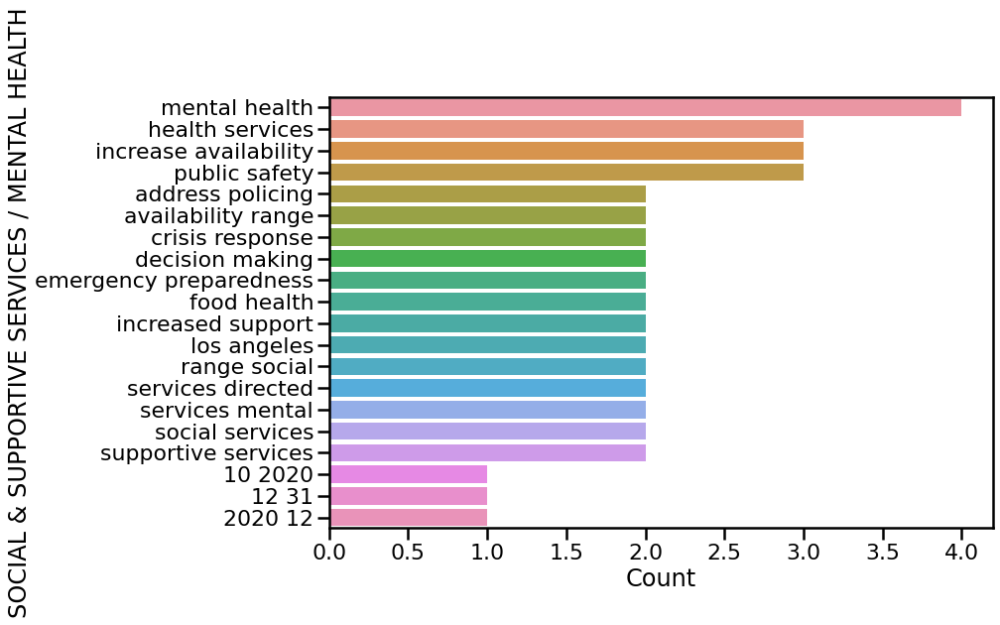

In [23]:
word_vectorizer = CountVectorizer(ngram_range=(2,2), analyzer= "word", stop_words="english")
sparse_matrix= word_vectorizer.fit_transform(df.iloc[11])
freq = sum(sparse_matrix).toarray()[0]
word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names(), columns= ['frequency'])
word = word.nlargest(columns = "frequency", n=20)
plt.figure(figsize=(12,8))
ax = sns.barplot(data = word, y=word.index, x='frequency')
sns.set_context("poster")
ax.set(xlabel="Count", ylabel=df.columns[11])
plt.show()

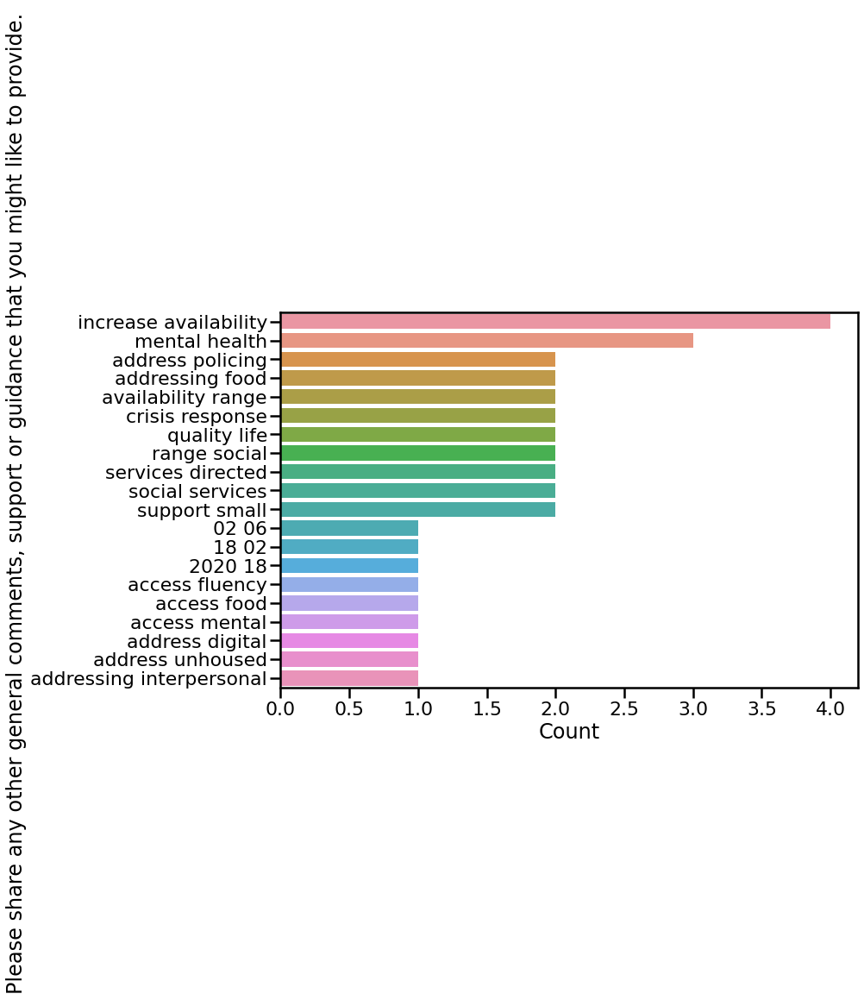

In [24]:
word_vectorizer = CountVectorizer(ngram_range=(2,2), analyzer= "word", stop_words="english")
sparse_matrix= word_vectorizer.fit_transform(df.iloc[19])
freq = sum(sparse_matrix).toarray()[0]
word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names(), columns= ['frequency'])
word = word.nlargest(columns = "frequency", n=20)
plt.figure(figsize=(12,8))
ax = sns.barplot(data = word, y=word.index, x='frequency')
sns.set_context("poster")
ax.set(xlabel="Count", ylabel=df.columns[19])
plt.show()

## TF-IDF Vectorizer<a id="TF_-_IDF_Vectorizer"></a>

In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(analyzer="word", ngram_range=(1,2), min_df=0, stop_words='english')
tfidf_matrix= vectorizer.fit_transform(df.iloc[11])
print(tfidf_matrix.toarray())

[[0.33333333 0.33333333 0.33333333 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [26]:
qs = {}
for i in data.columns[1:]:
    qs[i] = data[i]

In [27]:
qs.keys()

dict_keys(['What ethnic group do you identify with? (Your response is optional)', 'Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?', 'If you chose "Prefer to self-describe" to the previous question, please do so here.', 'What Neighborhood Council are you from?', 'For how many years have you been a member of your NC Board?', 'Please select the option that best represents your point of view.', 'HOUSING', 'JOBS / BUSINESS / ECONOMIC DEVELOPMENT', 'SCHOOLS, EDUCATION & ARTS / CULTURE', 'QUALITY OF LIFE', 'SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH', 'PUBLIC SAFETY & EMERGENCY PREPAREDNESS', 'INFRASTRUCTURE & SUSTAINABILITY', 'Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.', 'Please exp

**what needs to get done**  
1. Lowercase all responses; standardizing text data (regex.sub(): remove unnecessary characters)  
2. Run TF-IDF on the responses before generating wordclouds    
3. Keyword/Name Entity Recognition  
4. Histogram for the lengths of responses (str.len)
spacy, pandas, scikit-learn // sentiment analysis? 

In [28]:
df1 = data.apply(lambda x: x.astype(str).str.lower())

In [29]:
df1.head()

,Timestamp,What ethnic group do you identify with? (Your response is optional),"Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?","If you chose ""Prefer to self-describe"" to the previous question, please do so here.",What Neighborhood Council are you from?,For how many years have you been a member of your NC Board?,Please select the option that best represents your point of view.,HOUSING,JOBS / BUSINESS / ECONOMIC DEVELOPMENT,"SCHOOLS, EDUCATION & ARTS / CULTURE",QUALITY OF LIFE,SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH,PUBLIC SAFETY & EMERGENCY PREPAREDNESS,INFRASTRUCTURE & SUSTAINABILITY,"Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.","Please explain why the categories you chose above are your top 3 areas of concern. Please also feel free to use this space to talk about other priorities you have for addressing racial, economic, or social inequities in the City of Los Angeles which did not appear on the list above:","What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action?","How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice?",How might civic engagement be built into the development of City programs?,"Please share any other general comments, support or guidance that you might like to provide."
0,7/12/2020 0:54:17,latino/hispano,male,nan,arleta,5-7 years,our communities have a high level of social an...,cut taxes and regulations to create more jobs,"promote business ownership, support small busi...",increase availability of educational/cultural ...,recreation & wellness programs,support non profit youth programs,create more policing in communities,infrastructure investment (such as street & si...,"jobs / business / economic development, school...",nan,"reduce taxes and regulations, school choice, m...",ensure everyone is equal under the law,nan,nan
1,7/6/2020 19:56:49,latino/hispano,female,nan,arroyo seco,0-1 year,our communities have a high level of social an...,"address rent control and evictions, address th...","create and promote living wage jobs, help for ...","youth recreation & development (youth centers,...","address the ""digital divide"" (improve individu...",increase access to mental health services & pr...,"address over-policing in la neighborhoods, dev...",infrastructure investment (such as street & si...,"housing, jobs / business / economic developmen...",the housing situation in los angeles has racia...,supported employment initiatives.\nscholarship...,work with nonprofits leaders who have ties in ...,ensuring that all programs go through communit...,nan
2,7/7/2020 1:01:24,white/caucasian,male,nan,arroyo seco,2-4 years,our communities have a moderate level economic...,"address rent control and evictions, address th...","help for those seeking work, support small bus...","afterschool and/or child care programs, increa...","address the ""digital divide"" (improve individu...",increase access to mental health services & pr...,develop & support alternatives to armed crisis...,infrastructure investment (such as street & si...,"housing, schools, education & arts / culture, ...",a community is only as strong as its care and ...,"funding for mental health services, schools an...",by establishing practices and procedures that ...,it must be part and parcel of any process that...,nan
3,7/6/2020 21:19:29,latino/hispano,male,nan,atwater village,2-4 years,our communities have a high level of social an...,"add

In [30]:
df1.iloc[1][6:19].values

array(['our communities have a high level of social and economic disparity issues.',
       'address rent control and evictions, address the unhoused, identify/support those in danger of becoming unhoused, preserve & increase supply of affordable housing',
       'create and promote living wage jobs, help for those seeking work, support equitable hiring and employee promotion practices',
       'youth recreation & development (youth centers, tutoring, college application support, etc), afterschool and/or child care programs, increase availability of educational/cultural spaces & programs (libraries, workshops)',
       'address the "digital divide" (improve individual or regional access to and fluency in internet/computers and related technologies), increased support for seniors with food, health, other services, increased support for families with food, health, other services, addressing food insecurity, addressing “food deserts” - communities that have inadequate access to food suppl

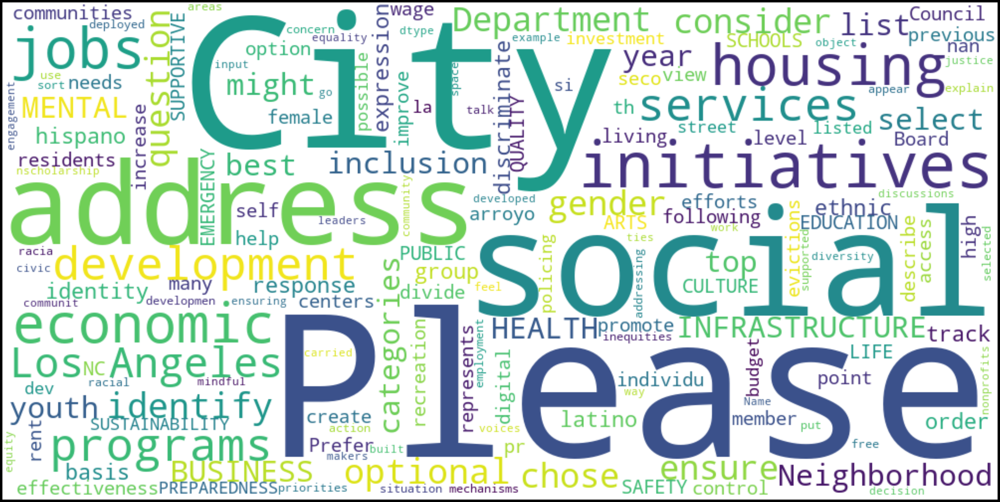

In [31]:
get_word_cloud(df1.iloc[1][1:19])

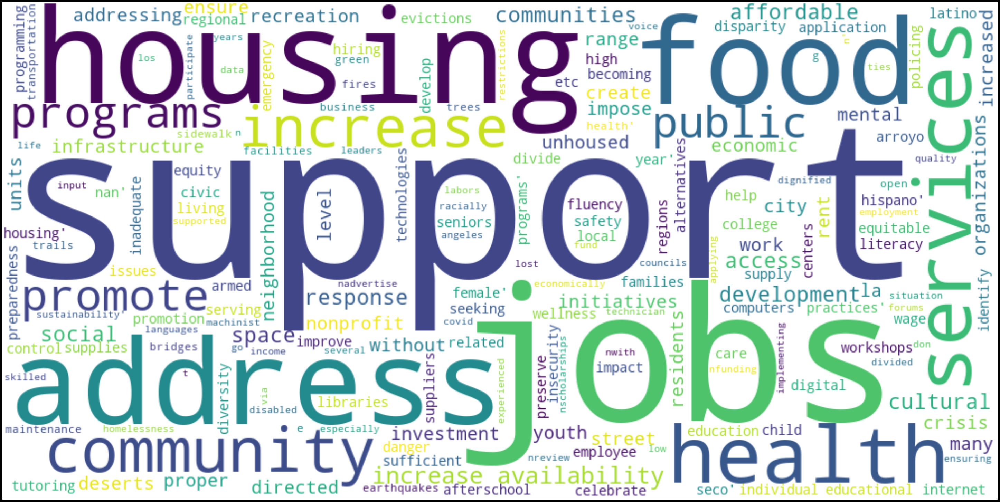

In [32]:
get_word_cloud(df1.iloc[1][1:19].values)

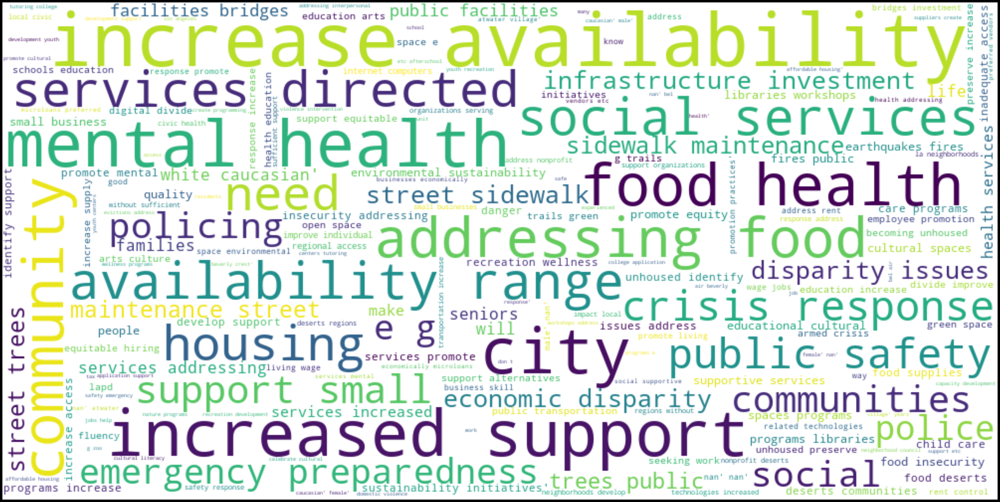

In [33]:
get_word_cloud(df1.iloc[0:695][1:19].values)

## Spacy

In [34]:
import spacy 
import en_core_web_sm
nlp = en_core_web_sm.load()


test = df1.iloc[1][6]
doc = nlp(test)

In [35]:
for token in doc: 
    print(token.text)
    
# [token.text for token in doc]  
# list of word tokens

our
communities
have
a
high
level
of
social
and
economic
disparity
issues
.


In [36]:
for word in doc:
    print(word.text, word.pos_, word.tag_)

our PRON PRP$
communities NOUN NNS
have VERB VBP
a DET DT
high ADJ JJ
level NOUN NN
of ADP IN
social ADJ JJ
and CCONJ CC
economic ADJ JJ
disparity NOUN NN
issues NOUN NNS
. PUNCT .


In [37]:
for word in doc.ents:
    print(word.text)

In [38]:
test2 = df1.iloc[1][6]
doc2 = nlp(test2)

for word in doc2.ents:
    print(word.text, word.label_)

## NLTK

In [39]:
import nltk 
from nltk.tokenize import word_tokenize
from nltk.tag import pos_tag

sample_text = df.iloc[1][6]

In [40]:
def preprocess(sent):
    sent = nltk.word_tokenize(sent)
    sent = nltk.pos_tag(sent)
    return sent

In [41]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/sathwikthecreator/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [42]:
sample_text = preprocess(sample_text)
sample_text

[('Our', 'PRP$'),
 ('communities', 'NNS'),
 ('have', 'VBP'),
 ('a', 'DT'),
 ('high', 'JJ'),
 ('level', 'NN'),
 ('of', 'IN'),
 ('social', 'JJ'),
 ('and', 'CC'),
 ('economic', 'JJ'),
 ('disparity', 'NN'),
 ('issues', 'NNS'),
 ('.', '.')]

In [43]:
import re

def word_count(row):
    total = 0
    for i in range(6, 20):
        line = df.iloc[row][i]
        count = len(re.findall(r'\w+', line))
        #print(count)
        total += count
    return total
    
#df.iloc[0:697]    

In [44]:
word_count(10)

487

In [45]:
#df1['word_count'] = df1.apply(word_count, axis =1)

In [46]:
# from codecademy 
from nltk.corpus import wordnet
def get_part_of_speech(word):
    part_of_speech = wordnet.synsets(word)
    pos_counts = Counter()
    pos_counts['n'] = len([item for item in part_of_speech if item.pos() == 'n'])
    pos_counts['v'] = len([item for item in part_of_speech if item.pos() == 'v'])
    pos_counts['a'] = len([item for item in part_of_speech if item.pos() == 'a'])
    pos_counts['r'] = len([item for item in part_of_speech if item.pos() == 'r'])
    
    most_likely_part = pos_counts.most_common(1)[0][0]
    return most_likely_part

In [47]:
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

from collections import Counter

#from part_of_speech import get_part_of_speech

nltk.download('stopwords')
nltk.download('wordnet')
text = data.iloc[55][10]

cleaned = re.sub("\W+", ' ', text).lower()
tokenized = word_tokenize(cleaned)

stop_words = stopwords.words('english')
filtered  = [word for word in tokenized if word not in stop_words]

normalizer = WordNetLemmatizer()
normalized = [normalizer.lemmatize(token, get_part_of_speech(token)) for token in filtered]

bag_of_words = Counter(normalized)
print(bag_of_words)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/sathwikthecreator/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/sathwikthecreator/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Counter({'increase': 1, 'support': 1, 'family': 1, 'food': 1, 'health': 1, 'service': 1, 'recreation': 1, 'wellness': 1, 'program': 1})


In [48]:
# Language Models: N-Gram using NLTK
from nltk.util import ngrams 

looking_bigrams = ngrams(tokenized, 2)
looking_bigrams_freq = Counter(looking_bigrams)

looking_trigrams = ngrams(tokenized, 3)
looking_trigrams_freq = Counter(looking_trigrams)

print(looking_bigrams_freq.most_common(3))
print(looking_trigrams_freq.most_common(3))

[(('increased', 'support'), 1), (('support', 'for'), 1), (('for', 'families'), 1)]
[(('increased', 'support', 'for'), 1), (('support', 'for', 'families'), 1), (('for', 'families', 'with'), 1)]


In [49]:
def pre_process(text):
    cleaned = re.sub(r'\W+', ' ',text).lower()
    tokenized = word_tokenize(cleaned)
    normalized = [normalizer.lemmatize(token, get_part_part_of_speech(token)) for token in tokenized]
    filtered = [word for word in normalized if word not in stop_words]
    return " ".join(filtered)

In [50]:
## Generating Topic Models
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decompositon import LatentDirichletAllocation 

text = data.iloc[10][16]
preprocess = [pre_process(token) for token in text]



ModuleNotFoundError: No module named 'sklearn.decompositon'